In [21]:
from google.cloud import storage
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Configura tu cliente de Google Cloud Storage
client = storage.Client(project='gcp-banorte-hackaton-team-32')

# Nombre del bucket y archivo
bucket_name = 'puroidmalv'
file_name = 'BankChurners.csv'

# Descargar el archivo de Google Cloud Storage
bucket = client.bucket(bucket_name)
blob = bucket.blob(file_name)
blob.download_to_filename('BankChurners.csv')

# Leer el archivo CSV
df = pd.read_csv('BankChurners.csv')

# Select relevant columns for consumption analysis
X = df[['Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Avg_Utilization_Ratio']]

# Standardize the data for better performance in clustering
scaler = StandardScaler()
gasto_data_scaled = scaler.fit_transform(X)

# Apply K-Means clustering to identify spending patterns
kmeans = KMeans(n_clusters=3, random_state=42)
df['Grupo de Consumo'] = kmeans.fit_predict(gasto_data_scaled)

# Label the clusters based on the overall analysis of spending patterns
def label_clusters(grupo_consumo):
    if grupo_consumo == 0:
        return "Moderate Spenders"
    elif grupo_consumo == 1:
        return "High Spenders"
    elif grupo_consumo == 2:
        return "Credit Maximizers"

# Apply the label to the dataset
df['Cluster Label'] = df['Grupo de Consumo'].apply(label_clusters)

/Users/sbaca/opt/anaconda3/envs/escuela4to/lib/python3.12/site-packages/google/auth/_default.py:76: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. See the following page for troubleshooting: https://cloud.google.com/docs/authentication/adc-troubleshooting/user-creds. 
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)


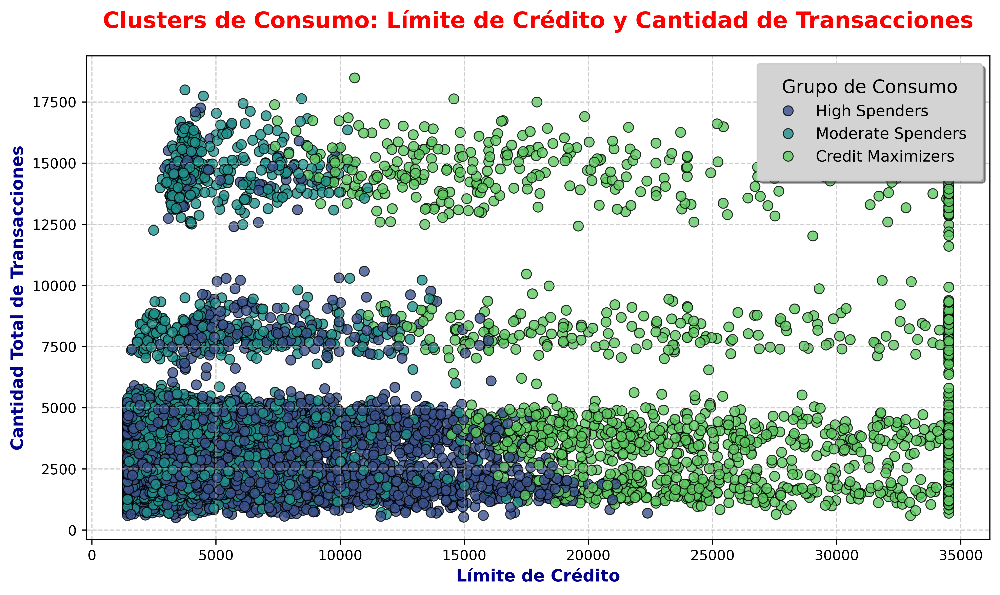

In [22]:
# Visualización mejorada de los clusters por límite de crédito y monto de transacciones
plt.figure(figsize=(10, 6), dpi=500)

# Gráfico de dispersión con personalización de colores, tamaño de puntos y estilo
sns.scatterplot(
    x=df['Credit_Limit'], y=df['Total_Trans_Amt'], hue=df['Cluster Label'], 
    palette='viridis', s=50, edgecolor='black', linewidth=0.7, alpha=0.8
)

# Etiquetas y título mejorados
plt.title('Clusters de Consumo: Límite de Crédito y Cantidad de Transacciones', 
          fontsize=16, fontweight='bold', color='r', pad=20)
plt.xlabel('Límite de Crédito', fontsize=12, fontweight='bold', color='darkblue')
plt.ylabel('Cantidad Total de Transacciones', fontsize=12, fontweight='bold', color='darkblue')

# Ajustar la leyenda
plt.legend(
    title='Grupo de Consumo', title_fontsize='13', fontsize='11', 
    loc='upper right', frameon=True, shadow=True, borderpad=1, facecolor='lightgrey'
)

# Ajuste estético de la cuadrícula
plt.grid(True, linestyle='--', alpha=0.6)

# Mostrar el gráfico con ajuste del diseño
plt.tight_layout()
plt.savefig('consumo_clusters.png', dpi=500)
plt.show()

In [26]:
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

# Estandarizar los datos para mejorar la precisión del modelo
scaler = StandardScaler()
fraude_data_scaled = scaler.fit_transform(X)

# Entrenar el modelo de Isolation Forest para detección de anomalías (potencial fraude)
iso_forest = IsolationForest(n_estimators=100, contamination=0.05, random_state=42)
df['Fraude'] = iso_forest.fit_predict(fraude_data_scaled)

# Dividir los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, df['Fraude'], test_size=0.2, random_state=42)

# Entrenar un modelo de Isolation Forest para detección de fraude
iso_forest = IsolationForest(n_estimators=100, contamination=0.05, random_state=42)
iso_forest.fit(X_train)

# Predecir en los datos de prueba
y_pred = iso_forest.predict(X_test)

# Evaluar resultados
print(classification_report(y_test, y_pred))
print('Accuracy:', round(accuracy_score(y_test, y_pred), 2))
print('Precision:', round(precision_score(y_test, y_pred), 2))
print('Recall:', round(recall_score(y_test, y_pred), 2))
print('F1 Score:', round(f1_score(y_test, y_pred), 2))

              precision    recall  f1-score   support

          -1       0.85      0.79      0.82        99
           1       0.99      0.99      0.99      1927

    accuracy                           0.98      2026
   macro avg       0.92      0.89      0.90      2026
weighted avg       0.98      0.98      0.98      2026

Accuracy: 0.98
Precision: 0.99
Recall: 0.99
F1 Score: 0.99


In [65]:
def generar_alerta_fraude(prediccion):
    if prediccion == -1:
        return "Alerta: Actividad sospechosa detectada. Revisa tus transacciones."
    else:
        return "Todo parece estar en orden."

# Aplicar el sistema de alertas
df['Alerta'] = df['Fraude'].apply(generar_alerta_fraude)

# Ver las alertas generadas
df[['Total_Trans_Amt', 'Fraude', 'Alerta']].head()

,Total_Trans_Amt,Fraude,Alerta
0,1144,1,Todo parece estar en orden.
1,1291,1,Todo parece estar en orden.
2,1887,1,Todo parece estar en orden.
3,1171,1,Todo parece estar en orden.
4,816,1,Todo parece estar en orden.


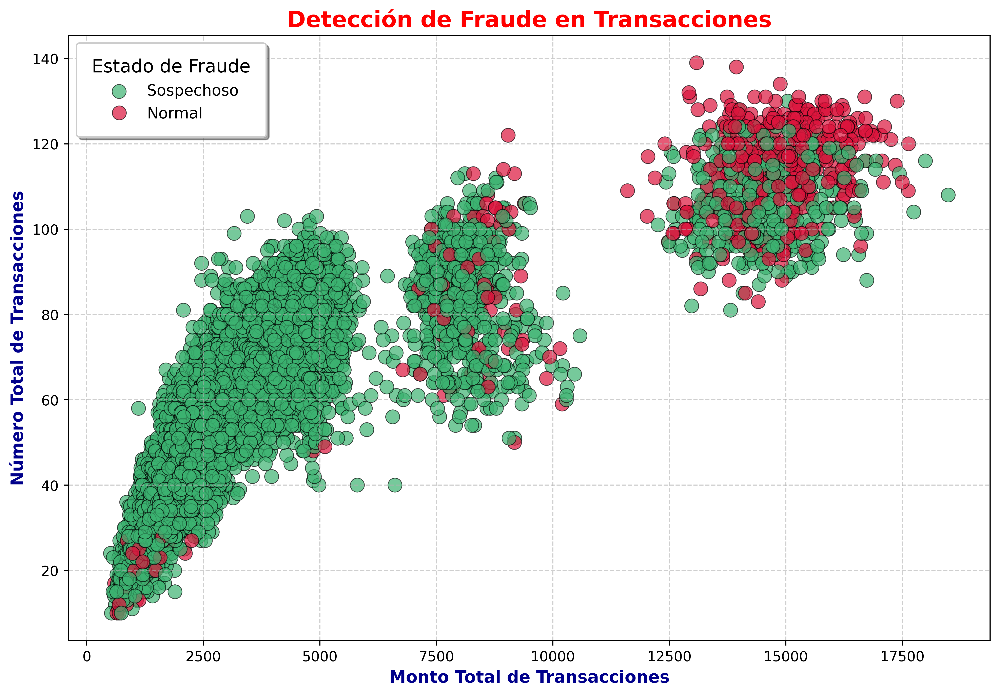

In [66]:
# Visualización de transacciones etiquetadas como fraude (versión mejorada)
plt.figure(figsize=(10, 7), dpi=500)
sns.scatterplot(
    x='Total_Trans_Amt', y='Total_Trans_Ct', hue='Fraude', data=df, 
    palette={-1: 'crimson', 1: 'mediumseagreen'}, 
    s=100, edgecolor='black', linewidth=0.5, alpha=0.7
)

# Etiquetas y título
plt.xlabel('Monto Total de Transacciones', fontsize=12, fontweight='bold', color='darkblue')
plt.ylabel('Número Total de Transacciones', fontsize=12, fontweight='bold', color='darkblue')
plt.title('Detección de Fraude en Transacciones', fontsize=16, fontweight='bold', color='r')

# Mejorar leyenda
plt.legend(
    title='Estado de Fraude', title_fontsize='13', fontsize='11',
    labels=['Sospechoso', 'Normal'], loc=0, frameon=True, shadow=True, borderpad=1
)

# Ajuste estético de la cuadrícula
plt.grid(True, linestyle='--', alpha=0.6)

# Mostrar el gráfico
plt.tight_layout()
plt.savefig('fraude_transacciones.png', dpi=500)
plt.show()
